
pip install -r requirements.txt
pip install pipwin
pipwin install -r requirements.txt

In [99]:
#from google.colab import drive
#drive.mount('/content/drive')

In [98]:
## Initial Imports

%matplotlib inline

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import random
from tqdm import tqdm_notebook as tqdm
from sklearn.model_selection import LeaveOneOut, GridSearchCV, KFold, train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score, f1_score, classification_report

**`Read data and Display data dimension`**

In [99]:
pd_speech_features = pd.read_csv('pd_speech_features.csv')
new_header = pd_speech_features.iloc[0] #grab the first row for the header
pd_speech_features = pd_speech_features[1:] #take the data less the header row
pd_speech_features.columns = new_header #set the header row as the df header
pd_speech_features.head()
print('The shape of the matrix is :', pd_speech_features.shape)

The shape of the matrix is : (756, 755)


#### Gather most general metadata about the data

In [100]:
pd_speech_features['patient/healthy count'] = 1
pd_speech_features.groupby('class').sum()/3

,patient/healthy count
class,
0,64.0
1,188.0


In [101]:
pd_speech_features = pd_speech_features.drop(['patient/healthy count'], axis = 1)  #756x755

All the data was imported in the object type, we now need to take care about the types in the dataframe

In [102]:
pd_speech_features =  pd_speech_features.astype(float) #per default all floats 
pd_speech_features[['id', 'numPulses', 'numPeriodsPulses']] = pd_speech_features[['id', 'numPulses', 'numPeriodsPulses']].astype(int) #ints
pd_speech_features[['gender', 'class']] = pd_speech_features[['gender', 'class']].astype('category') #categoricals
pd_speech_features.dtypes

0
id                              int32
gender                       category
PPE                           float64
DFA                           float64
RPDE                          float64
                               ...   
tqwt_kurtosisValue_dec_33     float64
tqwt_kurtosisValue_dec_34     float64
tqwt_kurtosisValue_dec_35     float64
tqwt_kurtosisValue_dec_36     float64
class                        category
Length: 755, dtype: object

In [103]:
pd_speech_features_no_tqwt = pd_speech_features[pd_speech_features.columns[1: -433]]
pd_speech_features_no_tqwt.head()

,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,...,app_LT_TKEO_std_1_coef,app_LT_TKEO_std_2_coef,app_LT_TKEO_std_3_coef,app_LT_TKEO_std_4_coef,app_LT_TKEO_std_5_coef,app_LT_TKEO_std_6_coef,app_LT_TKEO_std_7_coef,app_LT_TKEO_std_8_coef,app_LT_TKEO_std_9_coef,app_LT_TKEO_std_10_coef
1,1.0,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,0.000018,...,6.2990,16.7003,42.0762,101.0889,228.8489,493.8563,1015.7707,2091.9460,4188.2456,8373.9278
2,1.0,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,0.000016,...,6.2381,16.5376,41.7306,100.0918,226.9019,489.9169,1006.3702,2074.4541,4148.9889,8298.1606
3,1.0,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,0.000015,...,6.2163,16.4817,41.4869,99.6154,225.7803,486.9865,1001.7348,2064.1067,4127.0967,8254.7868
4,0.0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,0.000046,...,6.7833,16.8216,41.3157,94.4579,211.1565,443.3447,955.8128,1890.1299,3910.7029,7698.9389
5,0.0,0.32790,0.79782,0.53028,236,235,0.008162,0.002669,0.00535,0.000044,...,6.9366,18.3595,46.2704,108.6792,244.0607,541.2414,1057.2566,2242.5460,4297.4639,8645.2845


## Remove outliers
for one specifc column based on the interquartile interval 

for all the columns based on the z-score 

In [164]:

train_df = pd_speech_features

y_train = train_df['class']
y_train = np.array(y_train.values, dtype = 'int')
x_train = train_df.drop(['class','id'], axis = 1) 
x_train=x_train.values


In [105]:
features=train_df.columns.values.tolist()
features.remove('class')
features.remove('id')
print(len(features))
print(x_train.shape)

753
(756, 753)


In [106]:
x_train_df_no_tqwt=pd_speech_features_no_tqwt.values

#y_train_tqwt = train_df_tqwt['class']
#y_train_tqwt = np.array(y_train_tqwt.values, dtype = 'int')
#x_train_tqwt = train_df_tqwt.drop(['class'], axis = 1) 

#y_validation_tqwt = validation_df_tqwt['class']
#y_validation_tqwt = np.array(y_validation_tqwt.values, dtype = 'int')
#x_validation_tqwt = validation_df_tqwt.drop(['class'], axis = 1) 

In [107]:
print(x_train_df_tqwt.shape)
#print(y_train_tqwt.shape)

(756, 321)


In [108]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train= sc.fit_transform(x_train)
#newly added
x_train_df_no_tqwt= sc.fit_transform(x_train_df_tqwt)

trainx, testx, trainy, testy=train_test_split(x_train, y_train, test_size=0.25, random_state=10 )

trainx_no_tqwt, testx_no_tqwt, trainy_no_tqwt, testy_no_tqwt=train_test_split(x_train_df_tqwt, y_train, test_size=0.25, random_state=10 )

In [109]:
kfold=KFold(10, shuffle=True, random_state=10)

In [110]:
def svm_model(X,y, kfold):
    params={'C':[0.1, 1, 10, 100, 1000], 'gamma':[1, 0.1, 0.01, 0.001, 0.0001], 'kernel':['rbf']}

    grid=GridSearchCV(svm.SVC(probability=True, random_state=10),params,cv=kfold, refit=False, verbose=3)
    grid.fit(X,y)
    
    return grid

# with tqwt features


In [111]:
grid=svm_model(x_train, y_train, kfold)

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.816, total=   2.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.737, total=   2.7s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    5.3s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.763, total=   2.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.763, total=   2.6s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.803, total=   2.8s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.724, total=   2.8s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.653, total=   2.7s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.813, total=   2.7s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.747, total=   2.8s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .

[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.816, total=   2.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.737, total=   2.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.763, total=   2.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.763, total=   2.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.803, total=   2.7s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.724, total=   2.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.653, total=   2.6s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .

[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.747, total=   2.6s
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.640, total=   2.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.816, total=   2.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.737, total=   2.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.763, total=   2.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.763, total=   2.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.816, total=   2.6s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] .

[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.653, total=   2.7s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.827, total=   2.8s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.760, total=   2.7s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.640, total=   2.7s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.895, total=   2.1s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.868, total=   2.1s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.895, total=   2.1s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] .

[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.895, total=   2.1s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.855, total=   2.1s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.907, total=   2.1s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.973, total=   2.1s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.853, total=   2.1s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.933, total=   2.1s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .... C=1000, gamma=0.0001, kernel=rbf, score=0.855, total=   1.2s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  9.3min finished


In [112]:
print(grid.best_score_)
print(grid.best_params_)
print('cv scores:')
print(grid.cv_results_)
#estimator=grid.best_estimator_

0.9007936507936508
{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
cv scores:
{'mean_fit_time': array([2.66227164, 2.57135112, 2.53916781, 1.56697552, 1.44284129,
       2.68675294, 2.57073569, 2.54920208, 1.54130824, 1.43041041,
       2.68013825, 2.54740102, 2.57344098, 2.06008623, 1.26557629,
       2.67413442, 2.63610017, 2.59638867, 2.09751952, 1.1811589 ,
       2.67160957, 2.56774077, 2.57125533, 2.08728817, 1.16310413]), 'std_fit_time': array([0.08476498, 0.02104729, 0.00748589, 0.0180664 , 0.02963619,
       0.03589379, 0.01271078, 0.02432402, 0.02636347, 0.02894753,
       0.02728095, 0.07024321, 0.03192903, 0.01393915, 0.01770519,
       0.04771763, 0.14690829, 0.06200706, 0.04729457, 0.0166776 ,
       0.04333997, 0.00912147, 0.03245918, 0.02736908, 0.02450029]), 'mean_score_time': array([0.05680959, 0.05472407, 0.054124  , 0.03118899, 0.02878582,
       0.05735877, 0.05505729, 0.05413377, 0.03109107, 0.02828205,
       0.05664239, 0.05515118, 0.05373611, 0.03127866, 0.0243715 

In [113]:
estimator

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [114]:
import pandas as pd
grid_tqwt_df=pd.DataFrame(grid.cv_results_)
grid_tqwt_df.to_csv('grid_tqwt_cv_results_svm_no_refit_with_random_state.csv')

went through the csv file to find top param selections, rank-1

In [115]:
print(classification_report(y_train, estimator.predict(x_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       192
           1       1.00      1.00      1.00       564

    accuracy                           1.00       756
   macro avg       1.00      1.00      1.00       756
weighted avg       1.00      1.00      1.00       756



In [116]:
grid.best_params_

{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}

In [141]:
#x_train[0,:].shape
#svm_estimator.predict(x_train[[1,2,3],:])

In [118]:
wrong_pred_indices=[]

svm_estimator=svm.SVC(C= 100, gamma= 0.001, kernel= 'rbf',probability=True, random_state=10)
i=0

for trids, tstids in kfold.split(x_train):
    
    trainx, testx= x_train[trids,:], x_train[tstids,:]
    trainy, testy= y_train[trids], y_train[tstids]
    
    svm_estimator.fit(trainx, trainy)
    
    preds=svm_estimator.predict(x_train[tstids,:])
    
    print(classification_report(testy, svm_estimator.predict(testx)))
    
    if (i==9):#checking if it is last split
        for i in range(len(tstids)):
            if (y_train[tstids[i]]!=preds[i]):
                wrong_pred_indices.append(tstids[i])
    i=i+1

              precision    recall  f1-score   support

           0       0.88      0.50      0.64        14
           1       0.90      0.98      0.94        62

    accuracy                           0.89        76
   macro avg       0.89      0.74      0.79        76
weighted avg       0.89      0.89      0.88        76

              precision    recall  f1-score   support

           0       0.81      0.65      0.72        20
           1       0.88      0.95      0.91        56

    accuracy                           0.87        76
   macro avg       0.85      0.80      0.82        76
weighted avg       0.86      0.87      0.86        76

              precision    recall  f1-score   support

           0       0.92      0.61      0.73        18
           1       0.89      0.98      0.93        58

    accuracy                           0.89        76
   macro avg       0.90      0.80      0.83        76
weighted avg       0.90      0.89      0.89        76

              preci

In [119]:
print(wrong_pred_indices)

[44, 360, 468, 490, 668]


# lime explanation

In [120]:
!pip install shape

#lime

In [121]:
import lime
import lime.lime_tabular
import eli5
import shape

In [122]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(x_train, feature_names=features,
                                                  class_names=[0,1], verbose=True, mode='classification')

In [123]:
#wrong prediction
print('instance 44 (wrong prediction):')
e44=lime_explainer.explain_instance(x_train[44],svm_estimator.predict_proba, num_features=20)
print('instance 360 (wrong prediction):')
e360=lime_explainer.explain_instance(x_train[360],svm_estimator.predict_proba, num_features=20)

#correct prediction
print('instance 10 (correct prediction):')
e10=lime_explainer.explain_instance(x_train[10],svm_estimator.predict_proba, num_features=20)
print('instance 5 (correct prediction):')
e5=lime_explainer.explain_instance(testx[5],svm_estimator.predict_proba, num_features=20)

instance 44 (wrong prediction):
Intercept 0.7772040126688525
Prediction_local [0.6203981]
Right: 0.6074012592320325
instance 360 (wrong prediction):
Intercept 0.7654818198412368
Prediction_local [0.63988137]
Right: 0.19105148551255852
instance 10 (correct prediction):
Intercept 0.6640389279148861
Prediction_local [0.95242122]
Right: 0.9803128726788548
instance 5 (correct prediction):
Intercept 0.7896009562223151
Prediction_local [0.59262174]
Right: 0.6074012592320325


In [124]:
e44.show_in_notebook(show_table=True)

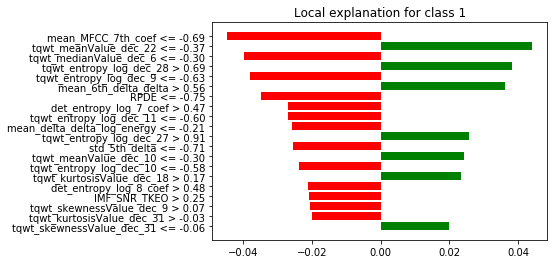

In [125]:
explanation=e44.as_pyplot_figure()
explanation.savefig('e44_explanation.png')

In [126]:
e360.show_in_notebook(show_table=True)

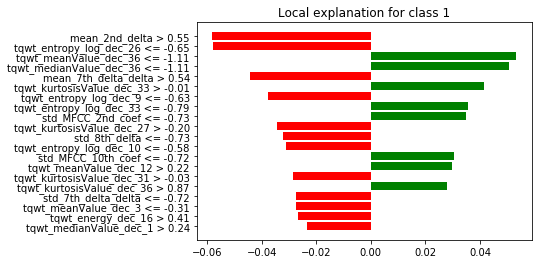

In [127]:
explanation31=e360.as_pyplot_figure()
explanation31.savefig('e360_explanation.png')

In [128]:
e5.show_in_notebook(show_table=True)

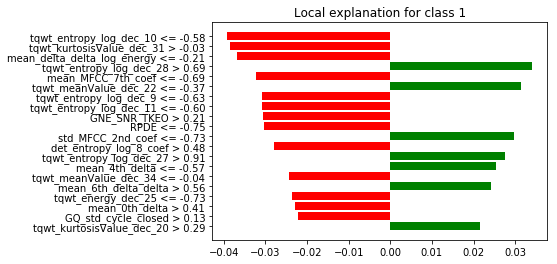

In [129]:
expliner5=e5.as_pyplot_figure()
expliner5.savefig('e5_lime_explanation.png')

In [130]:
e10.show_in_notebook(show_table=True)

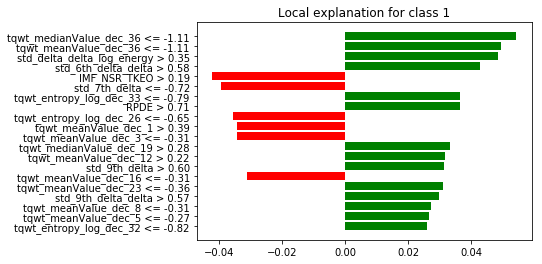

In [131]:
explainer10=e10.as_pyplot_figure()
explainer10.savefig('e10_lime_explanation.png')

# without tqwt

In [132]:
grid_no_tqwt=svm_model(x_train_df_no_tqwt, y_train, kfold)

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.816, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.737, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.1s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.763, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.763, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.803, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.724, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.653, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.813, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.747, total=   1.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .

[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.816, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.737, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.763, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.763, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.803, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.724, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.653, total=   1.1s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .

[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.747, total=   1.1s
[CV] C=10, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.1, kernel=rbf, score=0.640, total=   1.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.855, total=   1.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.803, total=   1.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.868, total=   1.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.855, total=   1.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] ........ C=10, gamma=0.01, kernel=rbf, score=0.855, total=   1.1s
[CV] C=10, gamma=0.01, kernel=rbf ....................................
[CV] .

[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.840, total=   1.1s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.893, total=   1.1s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.827, total=   1.1s
[CV] C=100, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=100, gamma=0.01, kernel=rbf, score=0.840, total=   1.1s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.882, total=   0.6s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.789, total=   0.6s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] ...... C=100, gamma=0.001, kernel=rbf, score=0.803, total=   0.6s
[CV] C=100, gamma=0.001, kernel=rbf ..................................
[CV] .

[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.882, total=   0.6s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.803, total=   0.6s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.827, total=   0.6s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.827, total=   0.6s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.800, total=   0.6s
[CV] C=1000, gamma=0.001, kernel=rbf .................................
[CV] ..... C=1000, gamma=0.001, kernel=rbf, score=0.867, total=   0.6s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .... C=1000, gamma=0.0001, kernel=rbf, score=0.842, total=   0.6s
[CV] C=1000, gamma=0.0001, kernel=rbf ................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  3.7min finished


In [134]:
#estimator_no_tqwt=grid_no_tqwt.best_estimator_
#print(classification_report(testy, estimator_no_tqwt.predict(testx_no_tqwt)))

In [140]:
grid_no_tqwt_df=pd.DataFrame(grid_no_tqwt.cv_results_)
grid_no_tqwt_df.to_csv('grid_no_tqwt_no_refit_with_random_state.csv')
grid_no_tqwt.best_params_

{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}

In [146]:
wrong_pred_indices_no_tqwt=[]

svm_estimator=svm.SVC(C= 10, gamma= 0.01, kernel= 'rbf',probability=True, random_state=10)
i=0

for trids, tstids in kfold.split(x_train_df_no_tqwt):
    
    trainx, testx= x_train_df_no_tqwt[trids,:], x_train_df_no_tqwt[tstids,:]
    trainy, testy= y_train[trids], y_train[tstids]
    
    svm_estimator.fit(trainx, trainy)
    
    preds=svm_estimator.predict(x_train_df_no_tqwt[tstids,:])
    
    print(classification_report(testy, svm_estimator.predict(testx)))
    
    if (i==9):#checking if it is last split
        for i in range(len(tstids)):
            if (y_train[tstids[i]]!=preds[i]):
                wrong_pred_indices_no_tqwt.append(tstids[i])
    i=i+1

              precision    recall  f1-score   support

           0       0.67      0.43      0.52        14
           1       0.88      0.95      0.91        62

    accuracy                           0.86        76
   macro avg       0.77      0.69      0.72        76
weighted avg       0.84      0.86      0.84        76

              precision    recall  f1-score   support

           0       0.86      0.30      0.44        20
           1       0.80      0.98      0.88        56

    accuracy                           0.80        76
   macro avg       0.83      0.64      0.66        76
weighted avg       0.81      0.80      0.77        76

              precision    recall  f1-score   support

           0       0.90      0.50      0.64        18
           1       0.86      0.98      0.92        58

    accuracy                           0.87        76
   macro avg       0.88      0.74      0.78        76
weighted avg       0.87      0.87      0.85        76

              preci

In [147]:
wrong_pred_indices_no_tqwt

[44, 74, 125, 360, 468, 490, 527, 630, 657, 668, 724, 735]

In [148]:
lime_explainer_no_tqwt = lime.lime_tabular.LimeTabularExplainer(x_train_df_no_tqwt, feature_names=features[:321],
                                                  class_names=[0,1], verbose=True, mode='classification')
lime_explainer_no_tqwt.random_state.seed(10)

In [150]:
print(len(features[:321]))
print(x_train_df_no_tqwt.shape[1])

321
321


In [155]:
print("No TQWT")
print('instance 44 (wrong prediction):')
en44=lime_explainer_no_tqwt.explain_instance(x_train_df_no_tqwt[44],svm_estimator.predict_proba, num_features=20)
print('instance 74 (wrong prediction):')
en74=lime_explainer_no_tqwt.explain_instance(x_train_df_no_tqwt[74],svm_estimator.predict_proba, num_features=20)

#correct prediction
print('instance 10 (correct prediction):')
en10=lime_explainer_no_tqwt.explain_instance(x_train_df_no_tqwt[10], svm_estimator.predict_proba, num_features=20)
print('instance 5 (correct prediction):')
en5=lime_explainer_no_tqwt.explain_instance(x_train_df_no_tqwt[5],svm_estimator.predict_proba, num_features=20)

No TQWT
instance 44 (wrong prediction):
Intercept 0.7905099927721421
Prediction_local [0.77869461]
Right: 0.6206643804362664
instance 74 (wrong prediction):
Intercept 0.7967849619875802
Prediction_local [0.76060966]
Right: 0.7758953157080339
instance 10 (correct prediction):
Intercept 0.7782088393780953
Prediction_local [0.81553519]
Right: 0.9670361337671323
instance 5 (correct prediction):
Intercept 0.7811912715962662
Prediction_local [0.8081505]
Right: 0.9670158031143284


In [156]:
en44.show_in_notebook(show_table=True)

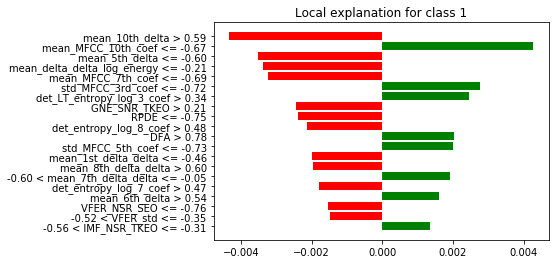

In [157]:
explainer44_tqwt=en44.as_pyplot_figure()
explainer44_tqwt.savefig('explainer 44 no tqwt.png')

In [158]:
en74.show_in_notebook(show_table=True)

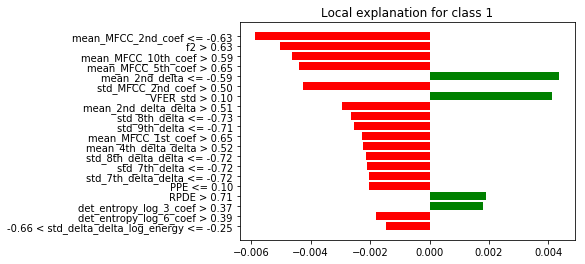

In [159]:
explainer74_tqwt=en74.as_pyplot_figure()
explainer74_tqwt.savefig('explainer 74 no tqwt.png')

In [160]:
en10.show_in_notebook(show_table=True)

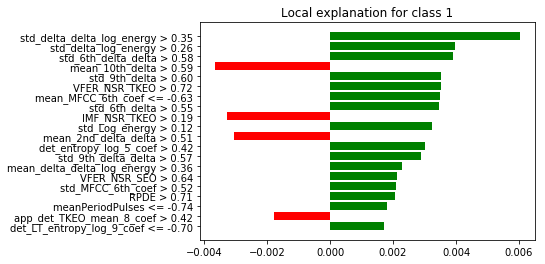

In [161]:
explainer10_tqwt=en10.as_pyplot_figure()
explainer10_tqwt.savefig('explainer 10 no tqwt.png')

In [162]:
en5.show_in_notebook(show_table=True)

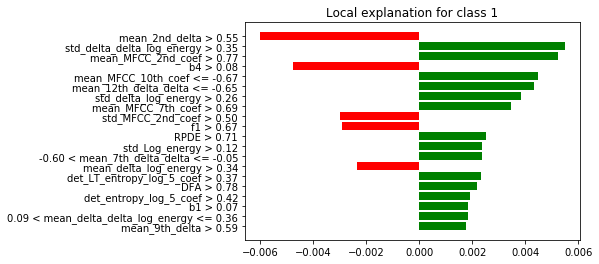

In [163]:
explainer5n=en5.as_pyplot_figure()
explainer5n.savefig('explainer 5 no tqwt.png')